<a href="https://colab.research.google.com/github/Camilojaravila/202120_ISIS4219_01-MACHINE_LEARNING_TECHNIQUES/blob/main/Taller/Laboratorio_I_Taller.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<img src="https://bloqueneon.uniandes.edu.co/content/enforced/52233-202120_ISIS4219_01/Laboratorios.png?_&d2lSessionVal=guLBE9l4cI9Tip6PM5JSzKgp6" ><br>
# Machine Learning Techniques - ISIS4219

Segundo Semestre - 2021




## Integrantes

*   Daniel Mateo Guatibonza Solano - 201611360
*   Raquel Andrea Cerda Montañez - 201533520
*   Sergio Eduardo Cárdenas Landazabal - 201613444



## **Problema**

Las enfermedades cardiovasculares son la principal causa de muerte en el mundo, y se calcula que cobran 17,9 millones de vidas al año (OMS). La enfermedad de las arterias coronarias es el tipo más común de enfermedad cardíaca y se produce debido a las obstrucciones (placa) desarrolladas en el interior de las arterias coronarias (vasos sanguíneos que alimentan los músculos del corazón). Los cardiólogos utilizan diversas técnicas de imagen y mediciones invasivas de la presión arterial para examinar y controlar la gravedad de dichas obstrucciones. <br>
Los factores de riesgo conductuales más importantes de estas enfermedades son una dieta poco saludable, la inactividad física, el consumo de tabaco y el uso nocivo del alcohol. Los efectos de los factores de riesgo pueden manifestarse en las personas en forma de aumento de la presión arterial, aumento de la glucosa en sangre, aumento de los lípidos en sangre y sobrepeso y obesidad.
Identificar a las personas con mayor riesgo de sufrir enfermedades cardiovasculares y garantizar que reciban el tratamiento adecuado puede evitar muertes prematuras. Con este objetivo en mente, se quiere utilizar las técnicas de machine learning para construir un modelo que permita predecir qué pacientes pueden estar en riesgo de padecer este tipo de cardiopatía.<br><br>
Referencias. <br>
OMS (s.f.). “Cardiovascular diseases”. https://www.who.int/health-topics/cardiovascular-diseases#tab=tab_1
<br><br>
**Fuente de Datos**: https://www.kaggle.com/agsam23/coronary-artery-disease/version/3


In [1]:
#Data management Libraries
import pandas as pd
import numpy as np
import sys
from pandas_profiling import ProfileReport

# Data Modeling Libraries
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.metrics import classification_report, plot_confusion_matrix
from sklearn_features.transformers import DataFrameSelector
from sklearn.compose import make_column_selector, ColumnTransformer

# Data visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns

#Save the model
from joblib import dump, load

In [2]:
data_df = pd.read_csv('st_fold_data.csv')
data_df.head()

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,label,kfold
0,0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0,0.0
1,1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2,0.0
2,2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1,0.0
3,3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0,0.0
4,4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0,0.0


In [3]:
ProfileReport(data_df)

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
data_df = data_df[data_df['ca'] != '?']
data_df = data_df[data_df['thal'] != '?']
data_df['label'] = (data_df['label'] > 0).astype('int32')
data_df.head()

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,label,kfold
0,0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0,0.0
1,1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,1,0.0
2,2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1,0.0
3,3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0,0.0
4,4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0,0.0


In [5]:
data_training = data_df[data_df['kfold']<4]
data_test = data_df[data_df['kfold']==4]

In [6]:
training_X = data_training.drop(['label'],axis=1)
training_Y = data_training['label']

In [7]:
ct = ColumnTransformer(transformers=[('drop', 'drop', ['Unnamed: 0', 'kfold']),
                                     ('one_hot', OneHotEncoder(), ['cp','restecg','slope','ca','thal']),
                                     ('normalize', MinMaxScaler(), ['age','trestbps','chol','thalach','oldpeak'])],
                       remainder='passthrough')

In [18]:
training_Y.describe()

count    239.000000
mean       0.456067
std        0.499111
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max        1.000000
Name: label, dtype: float64

In [11]:
datos_prueba = ct.fit_transform(training_X)
prueba_df = pd.DataFrame(datos_prueba)
ProfileReport(prueba_df)

Summarize dataset:   0%|          | 0/38 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
model = Pipeline([
    ('preprocessing', ct),
    ('algoritmo',LogisticRegression(solver='liblinear'))
])

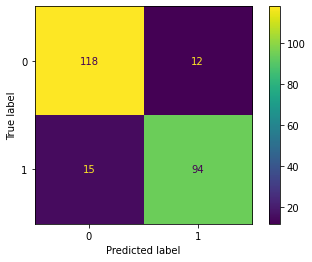

In [13]:
model.fit(training_X,training_Y)
plot_confusion_matrix(model,training_X,training_Y,values_format='d')

In [14]:
param_grid_logr = dict(algoritmo__penalty=['l2', 'elasticnet','none'],
                       algoritmo__C=[1e-5, 1e-4, 1e-3, 1e-2, 0.1, 1],
                       algoritmo__solver=['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
                       algoritmo__max_iter=[10,20,50,100],
                       preprocessing__normalize=[MinMaxScaler(), StandardScaler()])
grid_search_logr = GridSearchCV(model,param_grid=param_grid_logr,cv=5,verbose=3,scoring='accuracy')
grid_search_logr.fit(training_X,training_Y.ravel())

Fitting 5 folds for each of 720 candidates, totalling 3600 fits
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, pre

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.688 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the


[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=n

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", lin

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=libl

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__no

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p


[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__pena

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=elasti

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the


[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=n

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_val

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo_

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", l

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing_

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preproc

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalt

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, 

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", l

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algori

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lb

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, prepr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, pr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__m

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__pena

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_val

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Sett

[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 

[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1e-05, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algori

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, pre

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_it

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__pen

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Incr

[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preproc

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elastic

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=ela

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Sett

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sk

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, a

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, pr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalt

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penal

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__pena

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sa

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_i

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__p

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, 

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: 

[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__s

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 5/5] END algoritmo__C=0.0001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, pre

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.688 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessin

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=no

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, 

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algori

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing_

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, prepr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=elasticn

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=no

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sk

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__so

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elas

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algor

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=elastic

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_val

[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__pena

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__s

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, p

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 


[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.542 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.583 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.646 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.625 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalt

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=10

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=e

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: 

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_s

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalt

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed

[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 5/5] END algoritmo__C=0.001, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preproces

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args


[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessin

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasti

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, 

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, 

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", lin

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", l

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preproc

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preproces

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, p

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticn

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scal

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, p

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.708 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lb

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.958 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.708 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__no

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, a

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algorit

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, al

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, pr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preproc

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.667 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, al

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessin

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_ite

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=no

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_s

[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_val

[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo_

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed

[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 1/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.01, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=n

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iteration

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preproc

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=li

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normaliz

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algor

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algorit

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will igno

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, p

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__s

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='n

[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, p

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__so

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algorit

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritm

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: 

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=libl

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was 

[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preproce

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\p

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normaliz

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elas

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algori

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo_

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_val

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\pyth

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, prepr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__no

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessi

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasti

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, 

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.2s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, a

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  Fil

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: 

[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed

[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preproc

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:1323: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  "Setting penalty='none' will ignore the C and l1_ratio "
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed

[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=0.1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga,

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", lin


[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, prepro

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solve

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticn

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1315, in fit
    " got (l1_ratio=%r)" % self.l1_ratio)
ValueError: l1_ratio must be between 0 and 1; got (l1_ratio=None)

  FitFailedWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for the

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=elasticnet, algoritmo__solv

x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\utils\optimize.py:203: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  "number of iterations.", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    score

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=lbfgs, preproc

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=liblinear,

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=10, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__no

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which 

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=Stan

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo_

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=elasticnet, algoritmo__solver

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessi

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=Stan

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=20, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessin

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__norm

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=liblinear, preproces

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=Standa

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.p

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet 

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo_

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver sag supports only 'l2' or 'none' penalties, got elasticnet pe

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=n

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, p

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logi

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=liblinear, prepr

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=Stan

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.854 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=50, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__norm

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lb

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.938 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=liblinear, preprocessi

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.875 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.917 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=l2, algoritmo__solver=saga, preprocessing__normalize=MinMa

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programa

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=newton-cg, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=el

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 444, in _check_solver
    "got %s penalty." % (solver, penalty))
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got elastic

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=liblinear, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalt

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 451, in _check_solver
    " got solver={}.".format(solver))
ValueError: Only 'saga' solver supports elasticnet penalty, got solver=liblinear.

  

[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=elasticnet, algoritmo

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=newton-cg, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=MinMaxScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__sol

x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sk

[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=lbfgs, preprocessing__normalize=StandardScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=liblinear,

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:619: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "x:\programas\python\python37\lib\site-packages\sklearn\pipeline.py", line 346, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "x:\programas\python\python37\lib\site-packages\sklearn\linear_model\_logistic.py", line 455, in _check_solver
    "penalty='none' is not supported for the liblinear solver"
ValueError: penalty='none' is not supported for the liblinea

[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=0.771 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=sag, preprocessing__normaliz

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py:700: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 200, in __call__
    sample_weight=sample_weight)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "x:\programas\python\python37\lib\site-packages\sklearn\metrics\_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "x:\programas\python\python37\lib\site-packages\sklearn\utils\metaestimators.py", line 120, in <lambda>
    out = lambda *args

[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.896 total time=   0.0s
[CV 4/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=0.792 total time=   0.0s
[CV 5/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=MinMaxScaler();, score=nan total time=   0.0s
[CV 1/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.833 total time=   0.0s
[CV 2/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__normalize=StandardScaler();, score=0.812 total time=   0.0s
[CV 3/5] END algoritmo__C=1, algoritmo__max_iter=100, algoritmo__penalty=none, algoritmo__solver=saga, preprocessing__

x:\programas\python\python37\lib\site-packages\sklearn\model_selection\_search.py:925: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan n

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('drop',
                                                                         'drop',
                                                                         ['Unnamed: '
                                                                          '0',
                                                                          'kfold']),
                                                                        ('one_hot',
                                                                         OneHotEncoder(),
                                                                         ['cp',
                                                                          'restecg',
                                                                          'slope',
       

In [ ]:
print(grid_search_logr.best_params_)

In [ ]:
resultados = pd.DataFrame(grid_search_logr.cv_results_)
display(resultados)

In [ ]:
model = Pipeline([
    ('preprocessing', ct),
    ('algoritmo',SVC(tol=1e-4))
])
param_grid_SVM = dict(algoritmo__kernel=['linear','poly','rbf','sigmoid','precomputed'],
                       algoritmo__C=[1e-5, 1e-4, 1e-3, 1e-2, 0.1, 0.5, 1],
                       algoritmo__gamma=['scale','auto'],
                       algoritmo__max_iter=[10,20,50,100],
                       preprocessing__normalize=[MinMaxScaler(), StandardScaler()])
grid_search_SVM = GridSearchCV(model,param_grid=param_grid_SVM,cv=5,verbose=3,scoring='accuracy')
grid_search_SVM.fit(training_X,training_Y.ravel())

In [ ]:
print(grid_search_SVM.best_params_)

In [ ]:
resultados = pd.DataFrame(grid_search_SVM.cv_results_)
display(resultados)

In [ ]:
model = Pipeline([
    ('preprocessing', ct),
    ('algoritmo', KNeighborsClassifier())
])
param_grid_KNN = dict(algoritmo__n_neighbors=[3,5,9,15,25],
                       algoritmo__weights=['uniform','distance'],
                       algoritmo__algorithm=['auto','ball_tree','kd_tree','brute'],
                       preprocessing__normalize=[MinMaxScaler(), StandardScaler()])
grid_search_KNN = GridSearchCV(model,param_grid=param_grid_KNN,cv=5,verbose=3,scoring='accuracy')
grid_search_KNN.fit(training_X,training_Y.ravel())

In [ ]:
print(grid_search_KNN.best_params_)

In [ ]:
resultados = pd.DataFrame(grid_search_KNN.cv_results_)
display(resultados)